# Roberto Di Via 4486648
## Computer Vision - Final Project (Grad-CAM)

# Introduction
In this project we try to classify two different classes of images through a CNN and then we introduce Grad-CAM, a class-discriminative localization technique that generates visual explanations for any CNN-based network without requiring architectural changes or re-training. 

First we import the libraries that we will need to execute our code.

In [1]:
# Libraries 

import numpy as np
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Rescaling, BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.optimizers import Adam, SGD, RMSprop

# Display
import os, random
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [2]:
import sys
print("Python version:", sys.version)
print("Tensorflow version:", tf.__version__)
print("Keras version:", keras.__version__)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Python version: 3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]
Tensorflow version: 2.6.0
Keras version: 2.6.0
Num GPUs Available:  1


# Load and Visualize the Dataset

The dataset consists of two classes (rice and beans), each class has a train directory (75 images) and a test directory (25 images).  

First we initialize some useful variables:
- `train_dir` is the path to the images used in the training part
- `test_dir` is the patch to the images used in the test part
- `batch_size` is the size of the batches used in the training part
- `n_epochs` is the number of epochs used in the training part
- `new_img_size` is used to resize the images to the same 


In [114]:
train_dir = "dataset/train/"
test_dir = "dataset/test"

batch_size=32
n_epochs=10

new_img_size = 224
channels = 3

## Train set
We take the training set from a local directory. To do it we use the [`image_dataset_from_directory`](https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory) from keras. 

The labels are generated from the directory structure. In this case: rice and beans

In [4]:
## ============================================================= ## 
train_batch=tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred', # labels are generated from the directory structure
    label_mode="categorical",
    color_mode='rgb',
    image_size=(new_img_size, new_img_size),
    batch_size=batch_size,
    shuffle=True,
    seed=123
)

Found 150 files belonging to 2 classes.


In [5]:
print(train_batch)

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.float32)>


The output `train_batch` will contain a pair of batches for the images and the labels.

In [6]:
class_names = train_batch.class_names
print("Classes of the dataset: ", class_names)

Classes of the dataset:  ['beans', 'rice']


Then we visualize some images from the dataset.

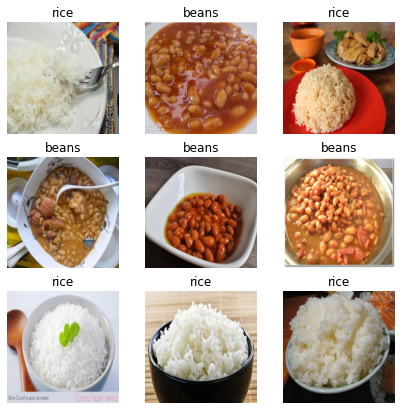

In [8]:
plt.figure(figsize=(7, 7))
for images, labels in train_batch:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis("off")

## Test set
We have a local directory even for the test set. So we use the same function used for the training set.

In [9]:
test_batch=tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels='inferred', 
    label_mode="categorical",
    color_mode='rgb',
    image_size=(new_img_size, new_img_size),
    batch_size=batch_size,
    shuffle=True,
    seed=123
)

Found 50 files belonging to 2 classes.


Then we visualize some images from the dataset.

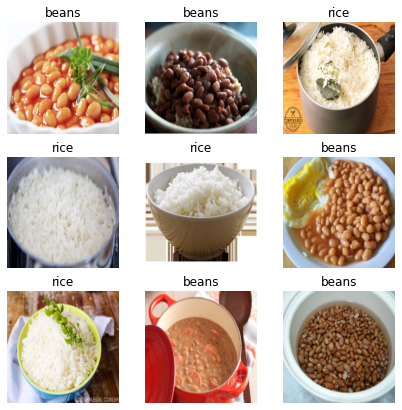

In [10]:
plt.figure(figsize=(7, 7))
for images, labels in test_batch.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis("off")

# Training a model from scratch

Now that we have properly loaded and analyzed our data, we are going to create a convolutional model in Keras. 
Usually a convolutional model is made by two subsequent part:
* A convolutional part
* A fully connected

We can show an example of the general structure in the next picture:
<img src="https://drive.google.com/uc?id=1duP8u9bs6ELNu4degUuYP4-YS1mBYn2O" width="600px"><br>

Usually the convolutional part is made by some layers composed by
* convolutional layer: performs a spatial convolution over images
* pooling layer: used to reduce the output spatial dimension from $n$ to 1 by averaging the $n$ different value or considering the maximum between them 
* dropout layer: applied to a layer, consists of randomly "dropping out" (i.e. set to zero) a number of output features of the layer during training.

The convolutional part produces its output and the fully connected part ties together the received information in order to solve the classification problem.
Let us start with a shallow architecture with only 2 conv.

In [11]:
#activation_layer = LeakyReLU()
activation_layer = 'relu'

In [115]:
model=keras.Sequential([
    
    Input(shape=(new_img_size, new_img_size, channels)),
    
    Rescaling(1./255), # Standardize the data to be in the [0, 1] range
    
    # Creating conv 1
    Conv2D(32, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Creating conv 2
    Conv2D(64, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Adding the dense final part
    Flatten(),
    Dense(64, activation=activation_layer),
    Dropout(0.25),
    Dense(2, activation='softmax')
])

### Configures the model for training

When we are building a model there are many design choises that we must operate: the choice of a Loss Function, the Metrics and the Optimizer.

**Loss functions** are used to compare the network's predicted output with the real output, in each pass of the backpropagations algorithm.

**Metrics** are used to evaluate a model; common metrics are precision, recall, accuracy, auc,..

The **Optimizer** determines the update rules of the weights. The performance and update speed may heavily vary from optimizer to optimizer; in choosing an optimizer what's important to consider is the network depth, the type of layers and the type of data

In [116]:
# Optimizers    https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
sgd = SGD(learning_rate=0.001, momentum=0.0, decay=0.0, nesterov=False)
rms = RMSprop(learning_rate=0.001,rho=0.9,epsilon=None,decay=0.0)

In [117]:
# Compile the model
model.compile(optimizer=adam,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [118]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_3 (Rescaling)      (None, 224, 224, 3)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 112, 112, 64)      18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 56, 56, 64)       

Let's see the layer's names 

In [119]:
for ilayer, layer in enumerate(model.layers):
    print("{:3.0f} - {:10}".format(ilayer, layer.name))

  0 - rescaling_3
  1 - conv2d_6  
  2 - max_pooling2d_6
  3 - dropout_9 
  4 - conv2d_7  
  5 - max_pooling2d_7
  6 - dropout_10
  7 - flatten_3 
  8 - dense_6   
  9 - dropout_11
 10 - dense_7   


## Train the model 
The batch size is a number of samples processed before the model is updated.<br>
The number of epochs is the number of complete passes through the training dataset.

In [122]:
# Train the model, iterating on the data in batches of 32 samples
# The fit function output is a History object. The history.history attribute is a record of
# training loss values and metrics values at successive epochs, as well as validation loss values 
# and validation metrics values 

history = model.fit(
    train_batch,
    batch_size=batch_size,
    epochs=n_epochs,
    shuffle=True,
    validation_data=test_batch
)

Epoch 1/10
5/5 [==============================] - 1s 199ms/step - loss: 0.0764 - accuracy: 0.9667 - val_loss: 0.2921 - val_accuracy: 0.8800
Epoch 2/10
5/5 [==============================] - 1s 199ms/step - loss: 0.0401 - accuracy: 0.9867 - val_loss: 0.3431 - val_accuracy: 0.9000
Epoch 3/10
5/5 [==============================] - 1s 200ms/step - loss: 0.0331 - accuracy: 0.9933 - val_loss: 0.3140 - val_accuracy: 0.8600
Epoch 4/10
5/5 [==============================] - 1s 155ms/step - loss: 0.0216 - accuracy: 1.0000 - val_loss: 0.3621 - val_accuracy: 0.8800
Epoch 5/10
5/5 [==============================] - 2s 243ms/step - loss: 0.0192 - accuracy: 0.9933 - val_loss: 0.3234 - val_accuracy: 0.9000
Epoch 6/10
5/5 [==============================] - 1s 155ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.3611 - val_accuracy: 0.9000
Epoch 7/10
5/5 [==============================] - 1s 155ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.3990 - val_accuracy: 0.9000
Epoch 8/10
5/5 [====

### Evaluate the model

In [123]:
_, train_acc = model.evaluate(train_batch, verbose=1)
_, test_acc = model.evaluate(test_batch, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

2/2 [==============================] - 0s 27ms/step - loss: 0.4736 - accuracy: 0.8600
Train: 0.993, Test: 0.860


### Training history visualization



In [124]:
def plot_history(history):
    
    fig = plt.figure(figsize = (15,5))

    # Plot training & validation accuracy values
    ax1 = fig.add_subplot(1,2,1)
    ax1.plot(history.history['accuracy'])
    ax1.plot(history.history['val_accuracy'])
    ax1.set_title('Model accuracy')
    ax1.set_ylabel('Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.legend(['Train', 'Val'], loc='upper left')

    # Plot training & validation loss values
    ax2 = fig.add_subplot(1,2,2)
    ax2.plot(history.history['loss'])
    ax2.plot(history.history['val_loss'])
    ax2.set_title('Model loss')
    ax2.set_ylabel('Loss')
    ax2.set_xlabel('Epoch')
    ax2.legend(['Train', 'Val'], loc='upper left')

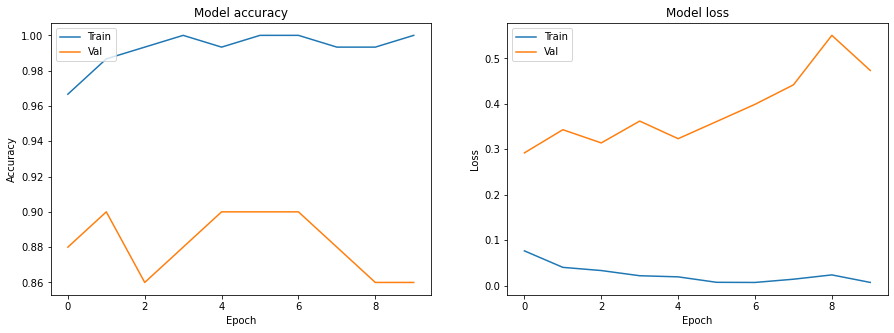

In [125]:
plot_history(history)

## Get random image and classify it
In this section we are going to take a random image from the test directory. Then we let the CNN model, that we have built, predict if the random image correspond to the 'rice' class or the 'beans' class.

In [126]:
folder_dir_rice = "dataset/test/rice/"
folder_dir_beans = "dataset/test/beans/"

In [127]:
def get_random_image_path(base_path):
    random_file = random.choice(os.listdir(base_path))
    random_path = os.path.join(base_path, random_file)
    return random_path

The first thing that we need to do when we are dealing with a new dataset is to operate some pre-processing operations. Data preprocessing usually refers to the steps applied to make data more suitable for learning.

In [128]:
def process_data(image_path, img_size):
    size = (img_size, img_size)

    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, size)
    #image = image.astype('float32') / 255 # normalization
        
    # We add a dimension to transform our array into a "batch" of size (1, 224, 224, 3)
    image = np.expand_dims(image, axis=0)
    
    return image

In [129]:
def decode_prediction(pred):
    # This function thresholds a probability to produce a prediction
    pred = pred.squeeze()
    i = np.argmax(pred)
    prediction = class_names[i]
    confidence = pred[i]*100
    return prediction, confidence

In [130]:
rice_img_path = get_random_image_path(folder_dir_rice)

In [131]:
beans_img_path = get_random_image_path(folder_dir_beans)

In [132]:
# Pre-processing of the Rice and the Beans Image

rice_img = process_data(rice_img_path, new_img_size)
beans_img = process_data(beans_img_path, new_img_size)

In [133]:
# Print what the top predicted class is
def classify_image(model, img):
    pred_raw = model.predict(img)
    prediction, confidence = decode_prediction(pred_raw)
    return prediction, confidence

In [134]:
rice_pred, rice_conf = classify_image(model, rice_img)
beans_pred, beans_conf = classify_image(model, beans_img)

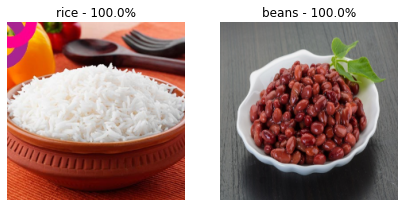

In [135]:
plt.figure(figsize=(7, 7))

ax = plt.subplot(1, 2, 1)
plt.imshow(rice_img.squeeze())
plt.axis('off')
plt.title(rice_pred + ' - ' + str(np.round(rice_conf, 3)) + '%')

ax = plt.subplot(1, 2, 2)
plt.imshow(beans_img.squeeze())
plt.axis('off')
plt.title(beans_pred + ' - ' + str(np.round(beans_conf, 3)) + '%')

plt.show()

## Missclassified images
In this section we take all the images from the test directory that are badly classified, and we display them.

In [136]:
# Defining auxiliary lists
missclassified_list = []
missclassified_label = []
missclassified_path = []

In [137]:
# ================ RICE =================== #  
for images in os.listdir(folder_dir_rice):
    image = process_data(folder_dir_rice+images, new_img_size)
    pred_raw = model.predict(image)
    pred, confidence = decode_prediction(pred_raw)
    
    if pred == 'beans':
        missclassified_list.append(image)
        missclassified_label.append(images)
        missclassified_path.append(folder_dir_rice+images)

In [138]:
# ================ BEANS =================== #       
for images in os.listdir(folder_dir_beans):
    image = process_data(folder_dir_beans+images, new_img_size)
    pred_raw = model.predict(image)
    pred, confidence = decode_prediction(pred_raw)
    
    if pred == 'rice':
        missclassified_list.append(image)
        missclassified_label.append(images)
        missclassified_path.append(folder_dir_beans+images)

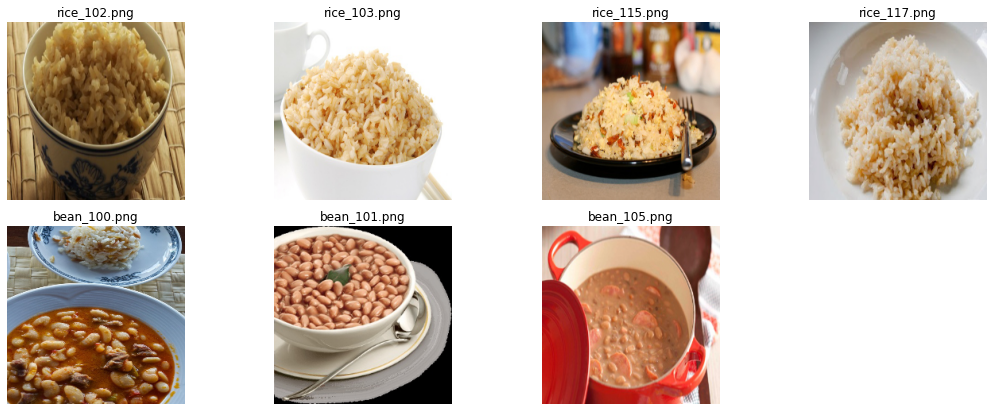

In [139]:
# ================ DISPLAY IMAGES =================== #       
plt.figure(figsize=(15,20))
for i, j in enumerate(missclassified_list):
    ax = plt.subplot(7, 4, i +1)
    plt.imshow(missclassified_list[i].squeeze())
    plt.title(missclassified_label[i])
    plt.axis("off")
plt.tight_layout()

# Gradient-weighted Class Activation Mapping (Grad-CAM)
### What is it:
Grad-CAM is a technique for producing ‘visual explanations’ for decisions from a large class of Convolutional Neural Network (CNN)-based models, making them more transparent and explainable.

Grad-CAM uses the gradient information flowing into the last convolutional layer of the CNN, which have the best compromise between high-level semantics and detailed spatial information, to assign importance values to each neuron for a particular decision of interest. The result is that produce a coarse localization map highlighting the important regions in the image for predicting the concept.

### How it works:

From a high-level, we take an image as input and create a model that is cut off at the layer for which we want to create a Grad-CAM heat-map. We attach the fully-connected layers for prediction. We then run the input through the model, grab the layer output, and loss. Next, we find the gradient of the output of our desired model layer w.r.t. the model loss. From there, we take sections of the gradient which contribute to the prediction, reduce, resize, and rescale so that the heat-map can be overlaid with the original image.
![image](https://miro.medium.com/max/1400/1*zq1lp5Bg8sdflG_ngrezzg.png)

### Why we use it:

In the context of image classification models, our visualizations 
- lend insights into failure modes of these models (showing that seemingly unreasonable predictions have reasonable explanations), 
- are robust to adversarial perturbations, 
- are more faithful to the underlying model, and 
- help achieve model generalization by identifying dataset bias.


### More information:
For more details you can check out the [academic paper](https://arxiv.org/pdf/1610.02391.pdf) which outlines the complete mathematics.

# Define the Grad-Cam 
Although our technique is fairly general in that it can be used to explain activations in any layer of a deep network, in this work, we focus on explaining output layer decisions only.

In this section we define two functions:
- `make_gradcam_heatmap`: to produce the heatmap
- `display_gradcam`: to display and superimpose the heatmap on the original image

In [140]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [141]:
def display_gradcam(img_path, heatmap, alpha=2):
    # Load the original image
    img = process_data(img_path, new_img_size)
    img = img.squeeze()

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    plt.figure(figsize=(10, 5))
    ax = plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Original Image')
    
    ax = plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title('Heat-map')
    
    ax = plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title('Grad-CAM heat-map')
    plt.show()

## Let's visualize the Grad-CAM
So, we start pre-processing the data and initializing the CNN model.

In [171]:
rice_img_path = get_random_image_path(folder_dir_rice)

In [172]:
beans_img_path = get_random_image_path(folder_dir_beans)

In [173]:
# Prepare image
rice_img_array = process_data(rice_img_path, new_img_size)
beans_img_array = process_data(beans_img_path, new_img_size)

# Make model
model = model

In order to understand the CNN, and so visualize the Grad-CAM, we have to take the last convolutional layer.

In [174]:
# Get last convolutional layer
conv2D_layers = [layer.name for layer in reversed(model.layers) if len(layer.output_shape) == 4 and isinstance(layer, tf.keras.layers.Conv2D)]
print("All layers: ", conv2D_layers)

last_conv_layer_name = conv2D_layers[0]

All layers:  ['conv2d_7', 'conv2d_6']


Now we can create and visualize the heatmap, passing as input the image, the CNN model and the last convolutional layer.

Class predicted: rice  -  88.03516030311584 %


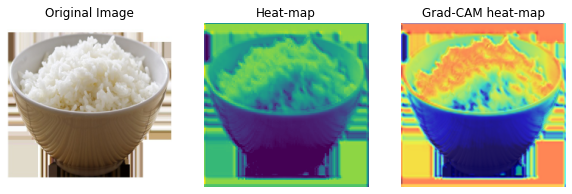

In [175]:
# Print the Prediction
rice_pred, rice_conf = classify_image(model, rice_img_array)
print("Class predicted:", rice_pred, " - ", rice_conf, "%")

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(rice_img_array, model, last_conv_layer_name)

# Superimpose the heatmap on origianl image and plot
display_gradcam(rice_img_path, heatmap, alpha=2)

Class predicted: beans  -  99.99997615814209 %


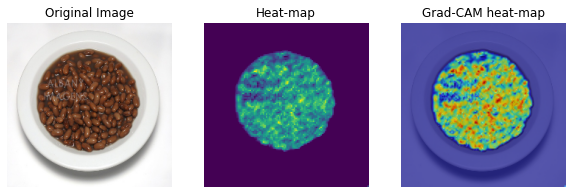

In [176]:
# Print the Prediction
beans_pred, beans_conf = classify_image(model, beans_img_array)
print("Class predicted:", beans_pred, " - ", beans_conf, "%")

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(beans_img_array, model, last_conv_layer_name)

# Superimpose the heatmap on origianl image and plot
display_gradcam(beans_img_path, heatmap, alpha=2)

## Lets try our model on Missclassified Images
We take the missclassified image from the auxiliary list "missclassified_path" that we created before.

Class predicted: beans  -  99.85246062278748 %


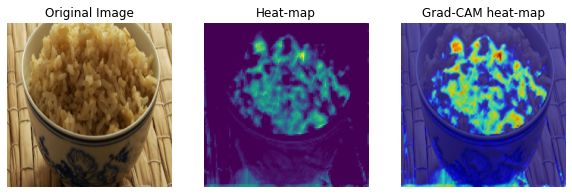

Class predicted: beans  -  94.29481029510498 %


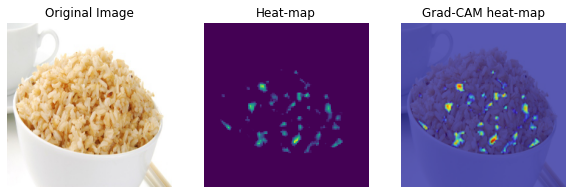

Class predicted: beans  -  84.23041105270386 %


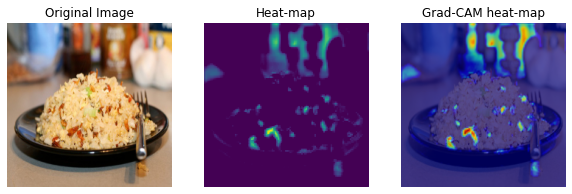

Class predicted: beans  -  77.77906060218811 %


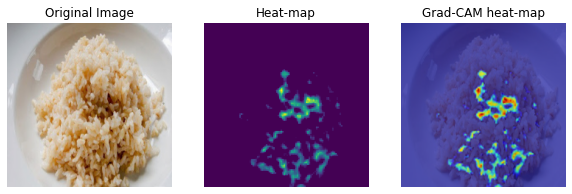

Class predicted: rice  -  79.26991581916809 %


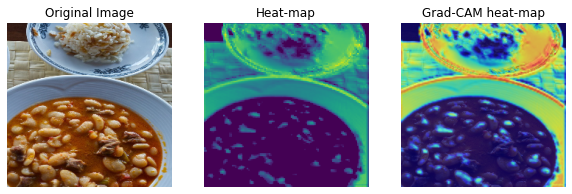

Class predicted: rice  -  73.00118207931519 %


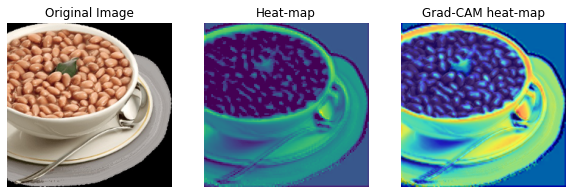

Class predicted: rice  -  99.92654919624329 %


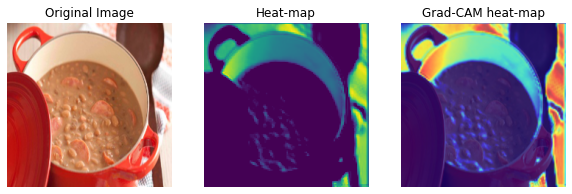

In [177]:
for i in range(0, len(missclassified_path)):
    
    img_array = process_data(missclassified_path[i], new_img_size)

    pred, conf = classify_image(model, img_array)
    print("Class predicted:", pred, " - ", conf, "%")

    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    display_gradcam(missclassified_path[i], heatmap, alpha=2)

## Let's try with different Models
Now we try different (pre-trained) models, in order to understand how the Grad-CAM works in different models.
For semplicity we create a function that encloses the steps that we did before.

In [178]:
def apply_and_display_gradcam(model, img_path, img_size, alpha=2):
    img_array = process_data(img_path, img_size)
    
    conv2D_layers = [layer.name for layer in reversed(model.layers) if len(layer.output_shape) == 4 and isinstance(layer, tf.keras.layers.Conv2D)]
    last_conv_layer_name = conv2D_layers[0]
    #print("Conv Layer:", last_conv_layer_name)
    
    img_pred, img_conf = classify_image(model, img_array)
    print("Class predicted:", img_pred, " - ", img_conf, "%")
    
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    display_gradcam(img_path, heatmap, alpha=alpha)

### Deeper Model
A deeper version of the model that we've built previously.

In [179]:
deep_model=keras.Sequential([
    Input(shape=(new_img_size, new_img_size, channels)),
    Rescaling(1./255), # Standardize the data to be in the [0, 1] range
    
    # Creating conv 1
    Conv2D(32, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Creating conv 2
    Conv2D(64, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Creating conv 3
    Conv2D(128, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Creating conv 4
    Conv2D(64, 3, activation=activation_layer, padding='same'),
    MaxPooling2D((2, 2),padding='same'),
    Dropout(0.25),
    
    # Adding the dense final part
    Flatten(),
    Dense(128, activation=activation_layer),
    Dropout(0.25),
    Dense(2, activation='softmax')
])

In [180]:
deep_model.compile(optimizer=adam,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [181]:
deep_model.fit(
    train_batch,
    batch_size=batch_size,
    epochs=n_epochs,
    shuffle=True,
    validation_data=test_batch
)

Epoch 1/10
5/5 [==============================] - 5s 557ms/step - loss: 1.6538 - accuracy: 0.4933 - val_loss: 0.6939 - val_accuracy: 0.5000
Epoch 2/10
5/5 [==============================] - 1s 170ms/step - loss: 0.6736 - accuracy: 0.5733 - val_loss: 0.6816 - val_accuracy: 0.5000
Epoch 3/10
5/5 [==============================] - 1s 173ms/step - loss: 0.5723 - accuracy: 0.7400 - val_loss: 0.5498 - val_accuracy: 0.8800
Epoch 4/10
5/5 [==============================] - 1s 174ms/step - loss: 0.3231 - accuracy: 0.9000 - val_loss: 0.3242 - val_accuracy: 0.9000
Epoch 5/10
5/5 [==============================] - 1s 171ms/step - loss: 0.1356 - accuracy: 0.9467 - val_loss: 0.2831 - val_accuracy: 0.9000
Epoch 6/10
5/5 [==============================] - 1s 171ms/step - loss: 0.1527 - accuracy: 0.9533 - val_loss: 0.3170 - val_accuracy: 0.8800
Epoch 7/10
5/5 [==============================] - 1s 170ms/step - loss: 0.0949 - accuracy: 0.9600 - val_loss: 0.2174 - val_accuracy: 0.9200
Epoch 8/10
5/5 [====

In [182]:
_, train_acc = deep_model.evaluate(train_batch, verbose=1)
_, test_acc = deep_model.evaluate(test_batch, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

2/2 [==============================] - 0s 31ms/step - loss: 0.2073 - accuracy: 0.9000
Train: 1.000, Test: 0.900


Class predicted: beans  -  83.6554765701294 %


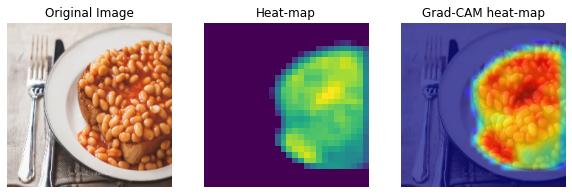

Class predicted: rice  -  98.4140396118164 %


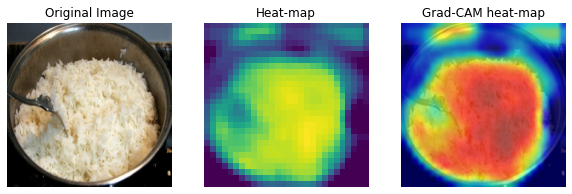

Class predicted: beans  -  96.9935655593872 %


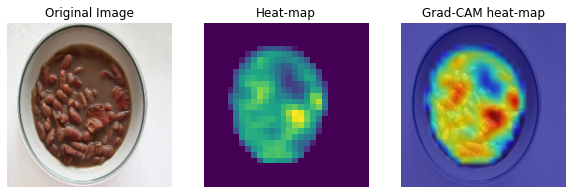

Class predicted: rice  -  96.43175601959229 %


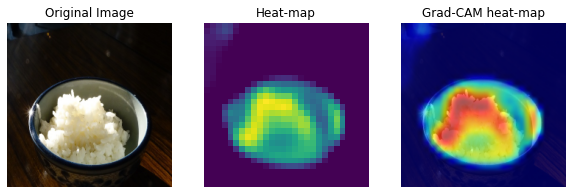

Class predicted: rice  -  52.063167095184326 %


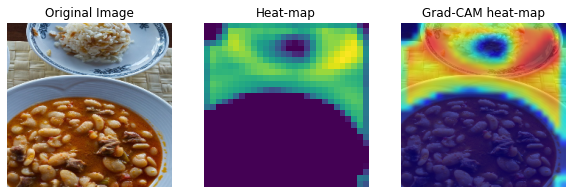

Class predicted: rice  -  98.6932098865509 %


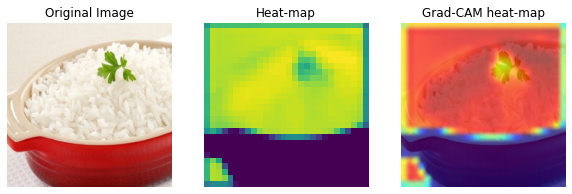

Class predicted: beans  -  96.69718146324158 %


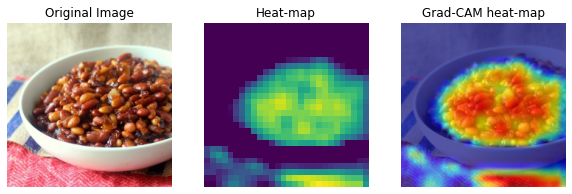

Class predicted: rice  -  58.271557092666626 %


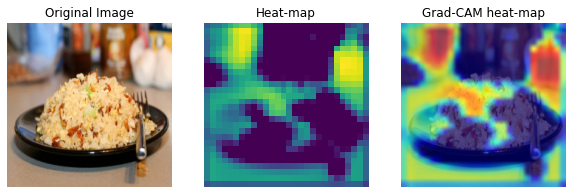

Class predicted: beans  -  91.43239855766296 %


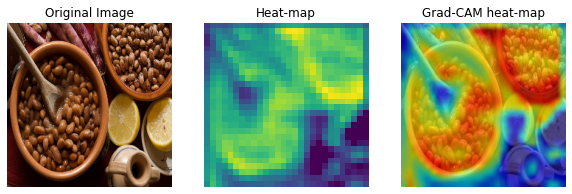

Class predicted: rice  -  92.7999198436737 %


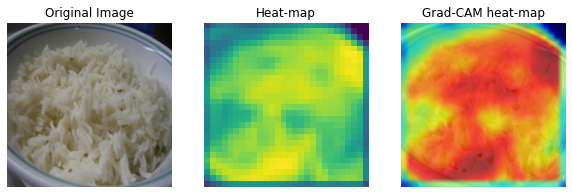

In [183]:
for i in range(0, 5):
    rice_img_path = get_random_image_path(folder_dir_rice)
    beans_img_path = get_random_image_path(folder_dir_beans)
    
    apply_and_display_gradcam(deep_model, beans_img_path, new_img_size)
    apply_and_display_gradcam(deep_model, rice_img_path, new_img_size)

### Missclassified Images from the Shallow Architecture

Class predicted: beans  -  89.1878604888916 %


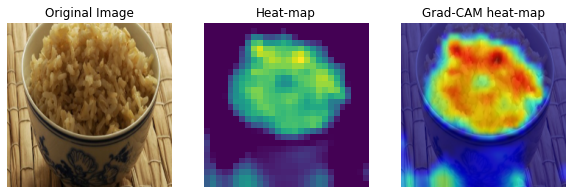

Class predicted: rice  -  57.69225358963013 %


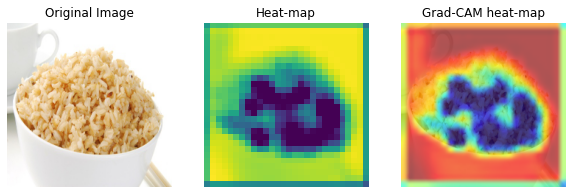

Class predicted: rice  -  58.271557092666626 %


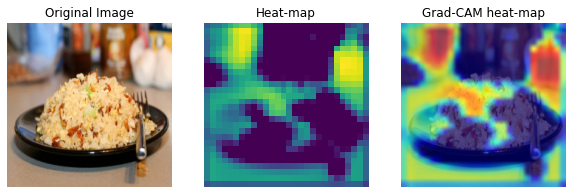

Class predicted: rice  -  68.04988980293274 %


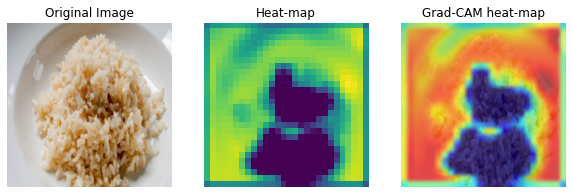

Class predicted: rice  -  52.063167095184326 %


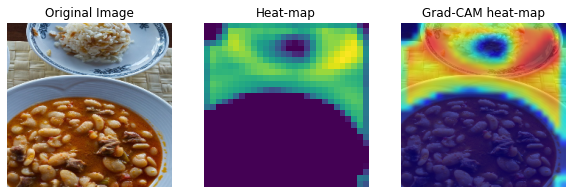

Class predicted: rice  -  63.74915838241577 %


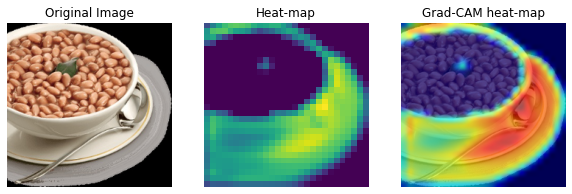

Class predicted: rice  -  58.418452739715576 %


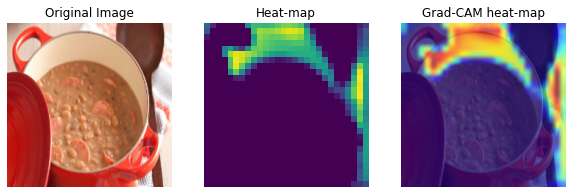

In [184]:
for i in range(0, len(missclassified_path)):
    img_path = missclassified_path[i]
    
    apply_and_display_gradcam(deep_model, img_path, new_img_size)

### Pre-Trained Models
We will be using only the basic models, with changes made only to the final layer. This is because this is just a binary classification problem while these models are built to handle up to 1000 classes.

In [185]:
n_epochs = 5

In [186]:
def change_final_layer(base_model):
    
    # Since we don’t have to train all the layers, we make them non_trainable:
    for layer in base_model.layers:
        layer.trainable = False
    
    # Flatten the output layer to 1 dimension
   # x = Flatten()(base_model.output) # No needed, i use average pooling in base model

    # Add a fully connected layer with 512 hidden units and ReLU activation
    x = Dense(128, activation='relu')(base_model.output)

    # Add a dropout rate of 0.5
    x = Dropout(0.5)(x)

    # Add a final sigmoid layer with 1 node for classification output
    x = Dense(2, activation='softmax')(x)

    pre_trained_model = tf.keras.models.Model(base_model.input, x)
    
    return pre_trained_model

## VVG16 

In [187]:
from tensorflow.keras.applications.vgg16 import VGG16

base_model = VGG16( input_shape = (224, 224, 3), # Shape of our images
                    include_top = False, # Leave out the last fully connected layer
                    weights = 'imagenet',
                    pooling='avg')

pre_trained_model = change_final_layer(base_model)

In [188]:
pre_trained_model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
pre_trained_model.summary()

Model: "model_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0  

In [189]:
pre_trained_model.fit( train_batch, batch_size=batch_size, epochs=n_epochs, shuffle=True, validation_data=test_batch)

Epoch 1/5
5/5 [==============================] - 30s 4s/step - loss: 3.8414 - accuracy: 0.6000 - val_loss: 0.2625 - val_accuracy: 0.9000
Epoch 2/5
5/5 [==============================] - 2s 434ms/step - loss: 0.9884 - accuracy: 0.8867 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 3/5
5/5 [==============================] - 2s 435ms/step - loss: 0.4702 - accuracy: 0.9333 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 442ms/step - loss: 0.1784 - accuracy: 0.9600 - val_loss: 3.2336e-04 - val_accuracy: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 471ms/step - loss: 0.0375 - accuracy: 0.9867 - val_loss: 0.0566 - val_accuracy: 0.9800


In [190]:
_, train_acc = pre_trained_model.evaluate(train_batch, verbose=1)
_, test_acc = pre_trained_model.evaluate(test_batch, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

2/2 [==============================] - 1s 223ms/step - loss: 0.0566 - accuracy: 0.9800
Train: 1.000, Test: 0.980


Class predicted: beans  -  100.0 %


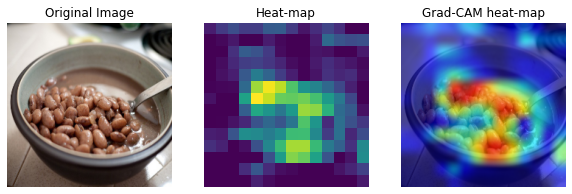

Class predicted: rice  -  99.99773502349854 %


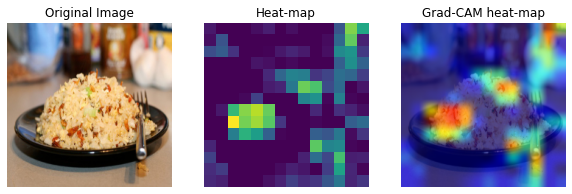

Class predicted: beans  -  100.0 %


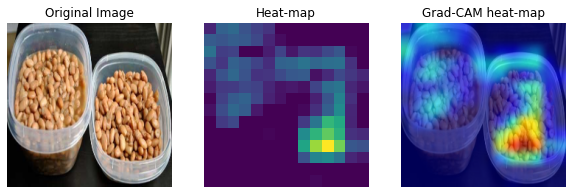

Class predicted: rice  -  100.0 %


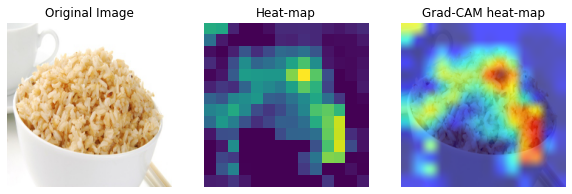

Class predicted: beans  -  100.0 %


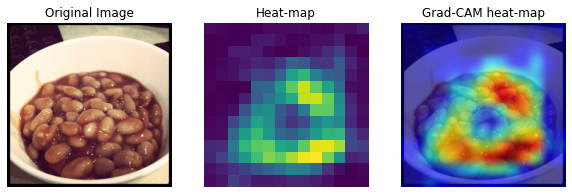

Class predicted: rice  -  99.99773502349854 %


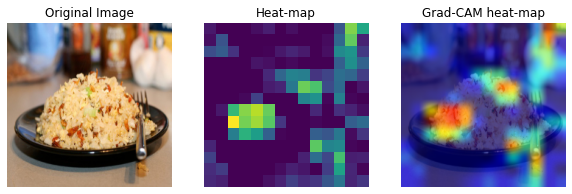

Class predicted: beans  -  100.0 %


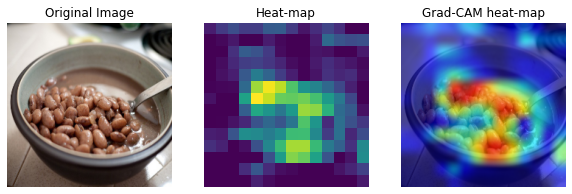

Class predicted: rice  -  99.99998807907104 %


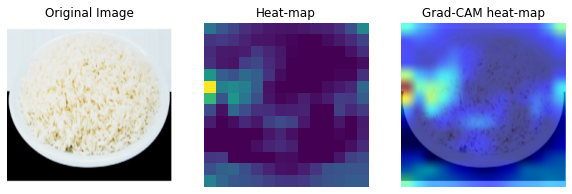

Class predicted: beans  -  100.0 %


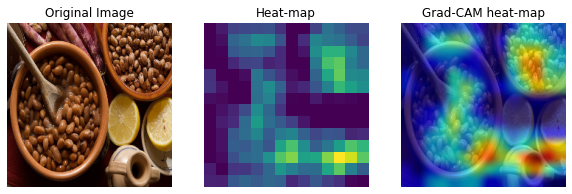

Class predicted: rice  -  100.0 %


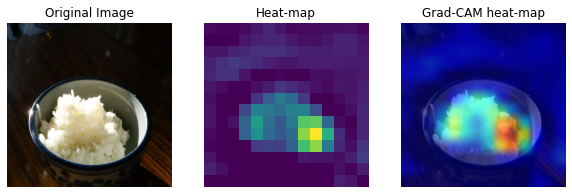

In [191]:
for i in range(0, 5):
    rice_img_path = get_random_image_path(folder_dir_rice)
    beans_img_path = get_random_image_path(folder_dir_beans)
    
    apply_and_display_gradcam(pre_trained_model, beans_img_path, new_img_size)
    apply_and_display_gradcam(pre_trained_model, rice_img_path, new_img_size)

### Missclassified Images from the Shallow Architecture

Class predicted: rice  -  99.99997615814209 %


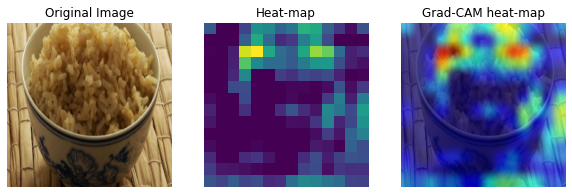

Class predicted: rice  -  100.0 %


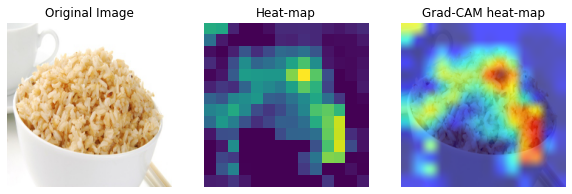

Class predicted: rice  -  99.99773502349854 %


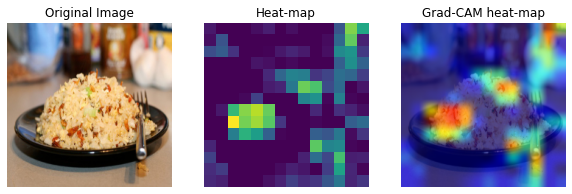

Class predicted: rice  -  99.99996423721313 %


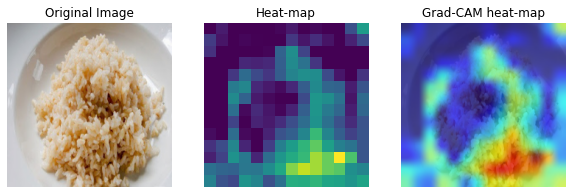

Class predicted: beans  -  100.0 %


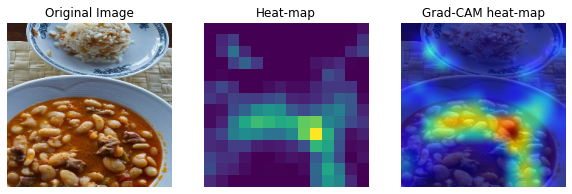

Class predicted: beans  -  100.0 %


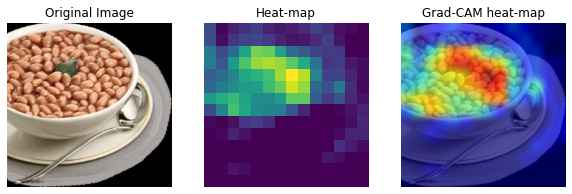

Class predicted: beans  -  99.99963045120239 %


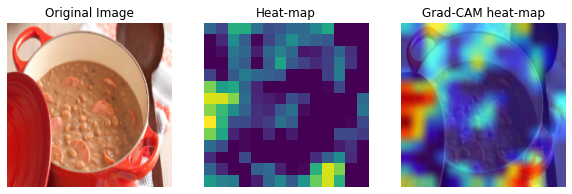

In [192]:
for i in range(0, len(missclassified_path)):
    img_path = missclassified_path[i]
    
    apply_and_display_gradcam(pre_trained_model, img_path, new_img_size)

## ResNet50

In [211]:
from tensorflow.keras.applications import ResNet50

base_model = ResNet50( input_shape = (224, 224, 3), # Shape of our images
                        include_top = False, # Leave out the last fully connected layer
                        weights = 'imagenet',
                        pooling='avg')

pre_trained_model = change_final_layer(base_model)

In [212]:
pre_trained_model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
pre_trained_model.summary()

Model: "model_124"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_10[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
__________________________________________________________________________________________

In [213]:
pre_trained_model.fit( train_batch, batch_size=batch_size, epochs=n_epochs, shuffle=True, validation_data=test_batch)

Epoch 1/5
5/5 [==============================] - 15s 2s/step - loss: 0.8061 - accuracy: 0.6933 - val_loss: 0.1729 - val_accuracy: 0.9200
Epoch 2/5
5/5 [==============================] - 2s 308ms/step - loss: 0.1737 - accuracy: 0.9533 - val_loss: 0.0637 - val_accuracy: 0.9800
Epoch 3/5
5/5 [==============================] - 2s 370ms/step - loss: 0.1865 - accuracy: 0.9533 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 4/5
5/5 [==============================] - 2s 366ms/step - loss: 0.1232 - accuracy: 0.9733 - val_loss: 0.1074 - val_accuracy: 0.9600
Epoch 5/5
5/5 [==============================] - 2s 370ms/step - loss: 0.0743 - accuracy: 0.9733 - val_loss: 4.7602e-05 - val_accuracy: 1.0000


In [214]:
_, train_acc = pre_trained_model.evaluate(train_batch, verbose=1)
_, test_acc = pre_trained_model.evaluate(test_batch, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

2/2 [==============================] - 0s 137ms/step - loss: 4.7602e-05 - accuracy: 1.0000
Train: 1.000, Test: 1.000


Class predicted: beans  -  100.0 %


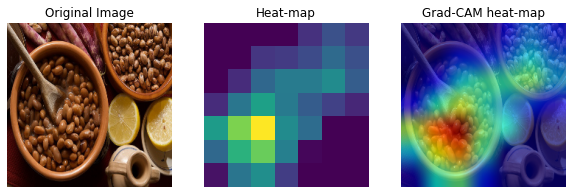

Class predicted: rice  -  99.99915361404419 %


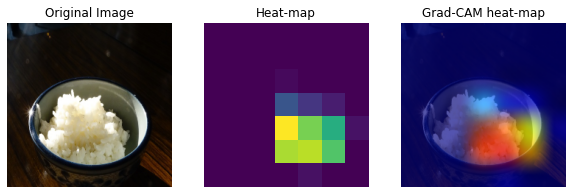

Class predicted: beans  -  99.99150037765503 %


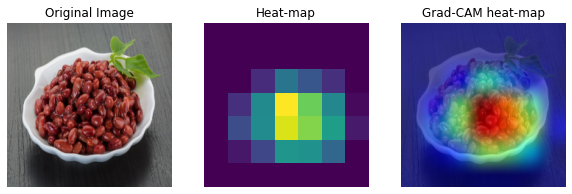

Class predicted: rice  -  100.0 %


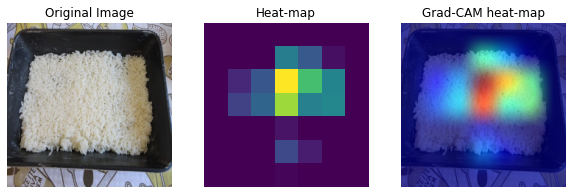

Class predicted: beans  -  100.0 %


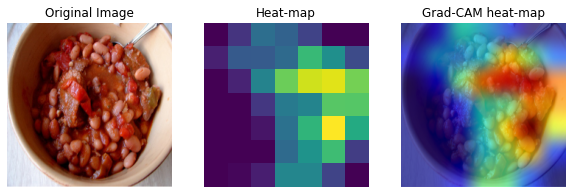

Class predicted: rice  -  100.0 %


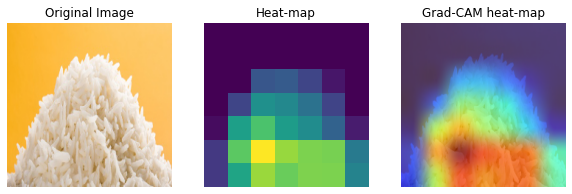

Class predicted: beans  -  100.0 %


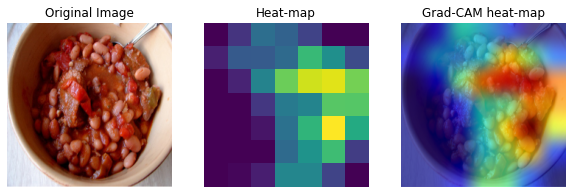

Class predicted: rice  -  100.0 %


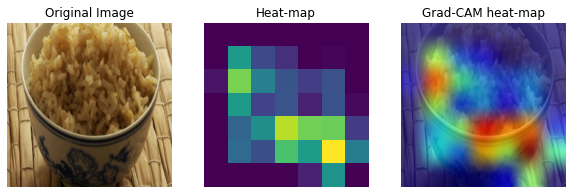

Class predicted: beans  -  100.0 %


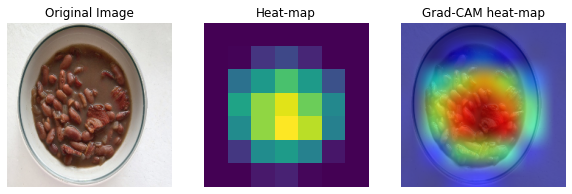

Class predicted: rice  -  99.99998807907104 %


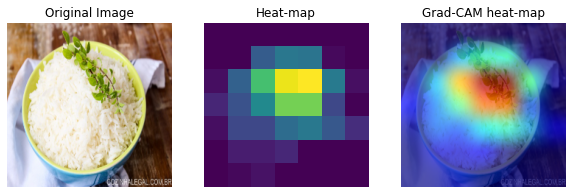

In [215]:
for i in range(0, 5):
    rice_img_path = get_random_image_path(folder_dir_rice)
    beans_img_path = get_random_image_path(folder_dir_beans)
    
    apply_and_display_gradcam(pre_trained_model, beans_img_path, new_img_size)
    apply_and_display_gradcam(pre_trained_model, rice_img_path, new_img_size)

### Missclassified Images from the Shallow Architecture

Class predicted: rice  -  100.0 %


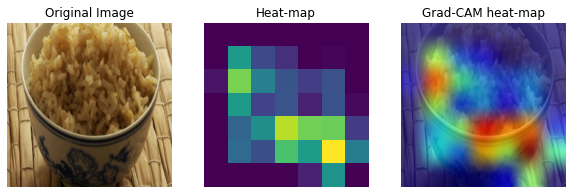

Class predicted: rice  -  99.99957084655762 %


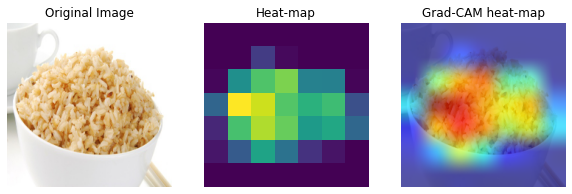

Class predicted: rice  -  99.98308420181274 %


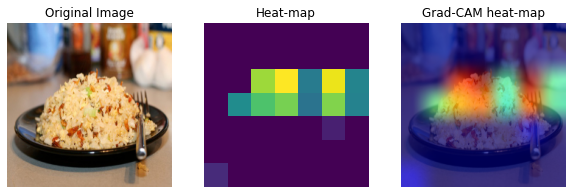

Class predicted: rice  -  99.9993085861206 %


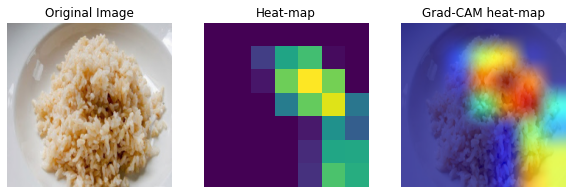

Class predicted: beans  -  99.99988079071045 %


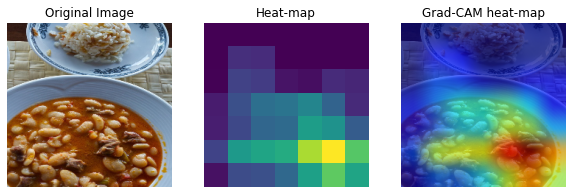

Class predicted: beans  -  100.0 %


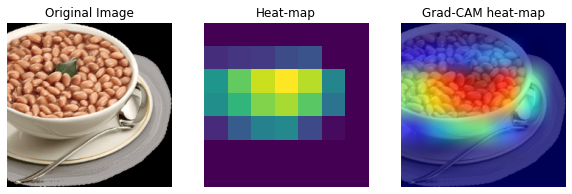

Class predicted: beans  -  99.88734126091003 %


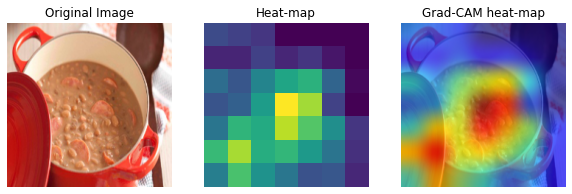

In [216]:
for i in range(0, len(missclassified_path)):
    img_path = missclassified_path[i]
    
    apply_and_display_gradcam(pre_trained_model, img_path, new_img_size)

## EfficientNetB0

In [217]:
from tensorflow.keras.applications import EfficientNetB0

base_model = EfficientNetB0( input_shape = (224, 224, 3), # Shape of our images
                        include_top = False, # Leave out the last fully connected layer
                        weights = 'imagenet',
                        pooling='avg')

pre_trained_model = change_final_layer(base_model)

In [218]:
pre_trained_model.compile(optimizer = adam, loss = 'categorical_crossentropy', metrics = ['accuracy'])
pre_trained_model.summary()

Model: "model_142"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling_5 (Rescaling)         (None, 224, 224, 3)  0           input_11[0][0]                   
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling_5[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
__________________________________________________________________________________________

In [219]:
pre_trained_model.fit( train_batch, batch_size=batch_size, epochs=n_epochs, shuffle=True, validation_data=test_batch)

Epoch 1/5
5/5 [==============================] - 14s 1s/step - loss: 0.3367 - accuracy: 0.8667 - val_loss: 0.0208 - val_accuracy: 1.0000
Epoch 2/5
5/5 [==============================] - 1s 227ms/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.0016 - val_accuracy: 1.0000
Epoch 3/5
5/5 [==============================] - 1s 229ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 6.2424e-04 - val_accuracy: 1.0000
Epoch 4/5
5/5 [==============================] - 2s 273ms/step - loss: 2.1415e-04 - accuracy: 1.0000 - val_loss: 3.3987e-04 - val_accuracy: 1.0000
Epoch 5/5
5/5 [==============================] - 2s 274ms/step - loss: 4.7031e-04 - accuracy: 1.0000 - val_loss: 1.5610e-04 - val_accuracy: 1.0000


In [220]:
_, train_acc = pre_trained_model.evaluate(train_batch, verbose=1)
_, test_acc = pre_trained_model.evaluate(test_batch, verbose=1)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

2/2 [==============================] - 0s 94ms/step - loss: 1.5610e-04 - accuracy: 1.0000
Train: 1.000, Test: 1.000


Class predicted: beans  -  99.96793270111084 %


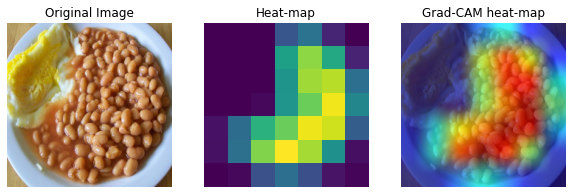

Class predicted: rice  -  100.0 %


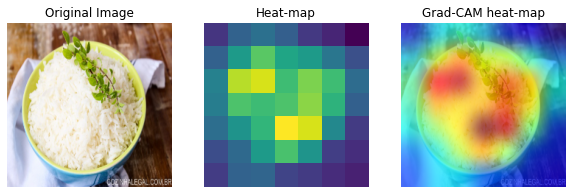

Class predicted: beans  -  100.0 %


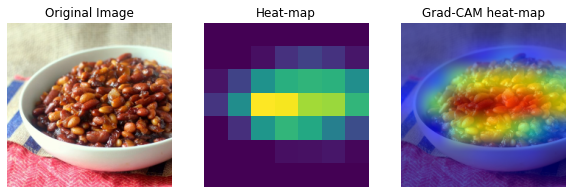

Class predicted: rice  -  100.0 %


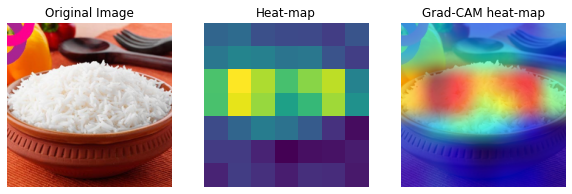

Class predicted: beans  -  99.99998807907104 %


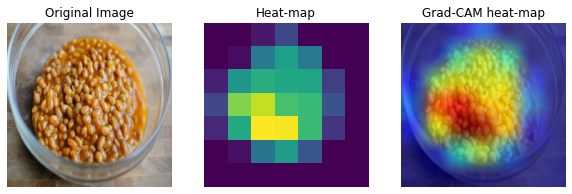

Class predicted: rice  -  100.0 %


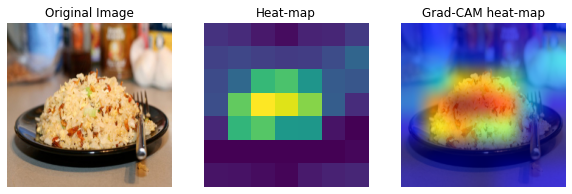

Class predicted: beans  -  100.0 %


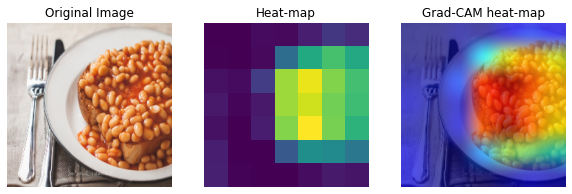

Class predicted: rice  -  100.0 %


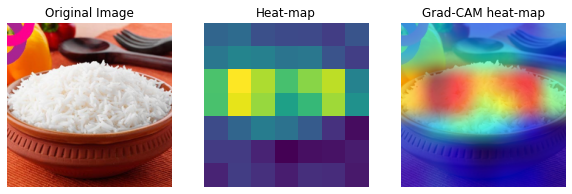

Class predicted: beans  -  100.0 %


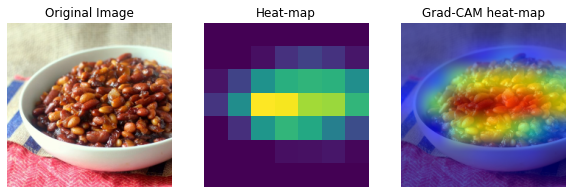

Class predicted: rice  -  99.99996423721313 %


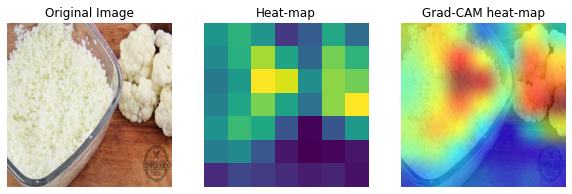

In [221]:
for i in range(0, 5):
    rice_img_path = get_random_image_path(folder_dir_rice)
    beans_img_path = get_random_image_path(folder_dir_beans)
    
    apply_and_display_gradcam(pre_trained_model, beans_img_path, new_img_size)
    apply_and_display_gradcam(pre_trained_model, rice_img_path, new_img_size)

### Missclassified Images from the Shallow Architecture

Class predicted: rice  -  99.99594688415527 %


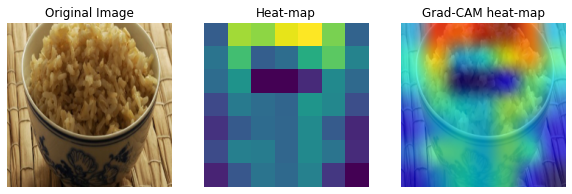

Class predicted: rice  -  99.99709129333496 %


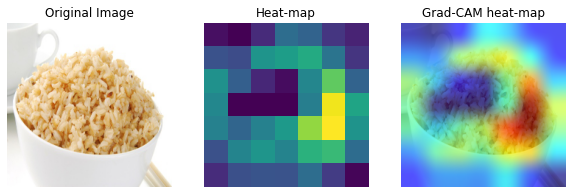

Class predicted: rice  -  100.0 %


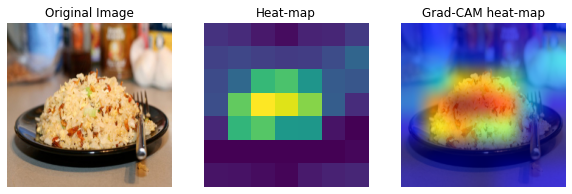

Class predicted: rice  -  99.99998807907104 %


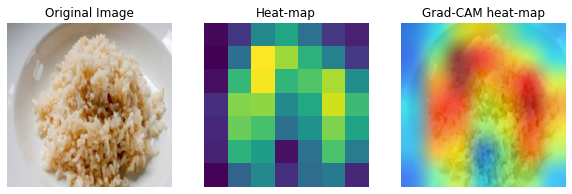

Class predicted: beans  -  99.9998927116394 %


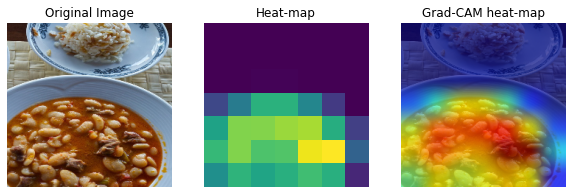

Class predicted: beans  -  100.0 %


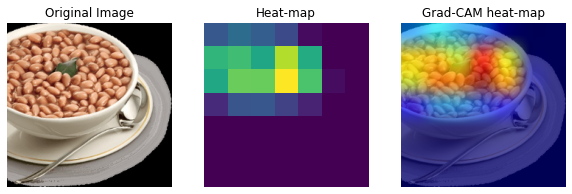

Class predicted: beans  -  99.32023882865906 %


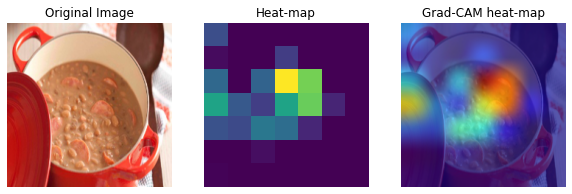

In [222]:
for i in range(0, len(missclassified_path)):
    img_path = missclassified_path[i]
    
    apply_and_display_gradcam(pre_trained_model, img_path, new_img_size)

# Conclusions

In this work, we proposed a class-discriminative localization technique - Gradient-weighted Class Activation Mapping (Grad-CAM) - for making any CNN-based model more transparent by producing visual explanations and creating more trust in models throughout the improvement process.

With the help of rice & beans, we’ve explored how a model differentiates classes. Analyzing the photos that are not classified correctly, we can see that the model occasionally confuses the images of rice with beans, this perhaps due to the low brightness that makes the image a darker color. Other times the model confuses the images of beans with rice, and in this case looks particularly at the background (for example the dishes). 

Since there are not many images in the initial dataset, the training process overfits and this causes the missclassification problems seen above. By increasing the images to train on, this problem does not occur as can be seen from the experiments done with the pretrained models.